<a href="https://colab.research.google.com/github/Nicocurri/Geopandas/blob/main/esercizi_verifica_Joinspaziali.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
!pip install rtree
!curl -L http://download.osgeo.org/libspatialindex/spatialindex-src-1.8.5.tar.gz | tar xz
os.chdir("/content/spatialindex-src-1.8.5")
!./configure
!make
!make install
!ldconfig

In [ ]:
%matplotlib inline
!pip install geopandas
!pip install contextily
import contextily
import matplotlib.pyplot as plt
from google.colab import drive
import pandas as pd
import geopandas
from shapely.geometry import Point
import xyzservices.providers as xyz

In [ ]:
drive.mount('/content/drive')

In [ ]:
print("- una lista (elenco) delle aree di sosta, indicando il nome della via, il numero civico e il numero di posti totali per le biciclette")
milano= geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/ds964_nil_wm/NIL_WM.dbf").to_crs(epsg= 3857)
sostaBici= geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/bike_areesosta/bike_areesosta.dbf")
strade= pd.read_csv("/content/drive/MyDrive/Colab Notebooks/stradario.csv")

- una lista (elenco) delle aree di sosta, indicando il nome della via, il numero civico e il numero di posti totali per le biciclette


In [ ]:
milano

In [ ]:
strade_belle= strade.drop_duplicates(subset=["CODICE_VIA"])
strade_belle

In [ ]:
strade_belle["CODICE_VIA"]=pd.to_numeric(strade_belle["CODICE_VIA"])
sostaBici["id_via"]=pd.to_numeric(sostaBici["id_via"])

In [ ]:
Df_strade_sostaBici = pd.merge(sostaBici, strade_belle, how="left", left_on=['id_via'], right_on = ['CODICE_VIA']).to_crs(epsg= 3857)
Df_strade_sostaBici[["DESCRIZIONE_VIA","CIVICO","stalli_tot"]]

In [ ]:
print("- una lista (elenco) analogo al precedente ma con anche  l'indicazione del quartiere")
Df_strade_sostaBici

In [ ]:
Df_strade_sostaBici_milano = geopandas.sjoin(Df_strade_sostaBici, milano, op='within', how='left')
Df_strade_sostaBici_milano[["DESCRIZIONE_VIA","CIVICO","stalli_tot","NIL"]]

In [ ]:
print("- i nomi dei quartieri in cui non ci sono aree di sosta;")
Df_strade_sostaBici_milano[Df_strade_sostaBici_milano["stalli_tot"]==0][["NIL"]]

- una mappa di Milano con l'indicazione dei quartieri in cui non ci sono aree di sosta


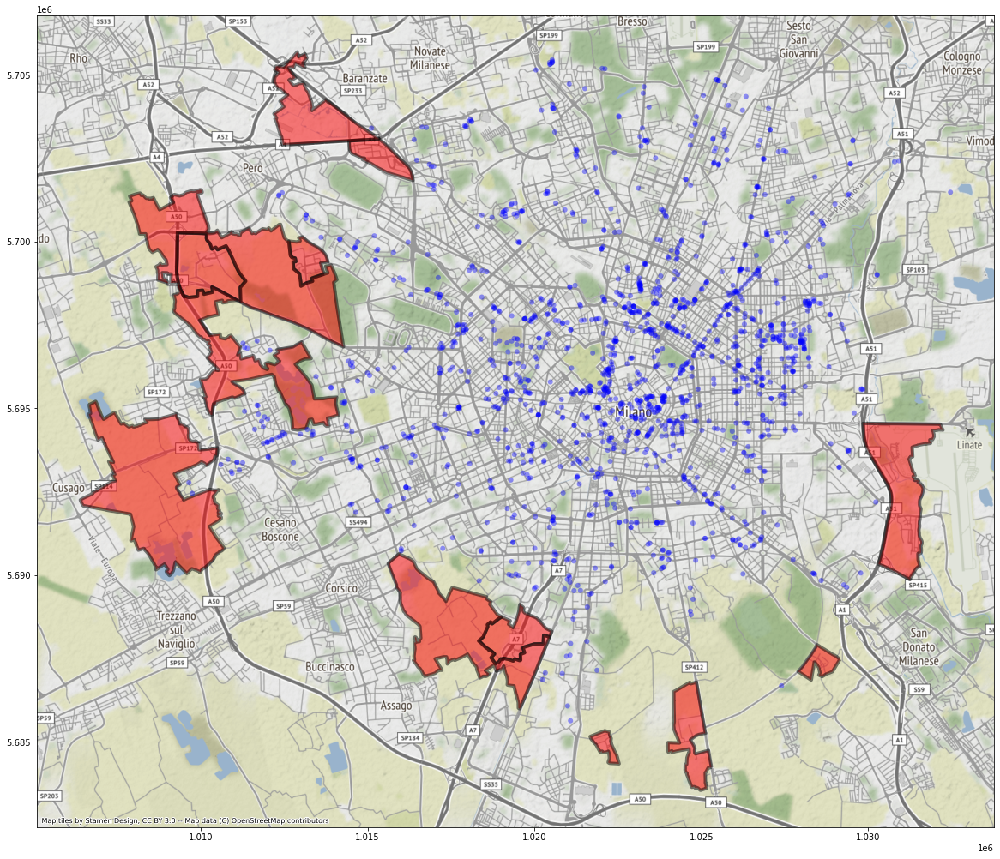

In [ ]:
print("- una mappa di Milano con l'indicazione dei quartieri in cui non ci sono aree di sosta")
ax=milano[~milano.intersects(sostaBici.unary_union)].to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "r",alpha = 0.5, edgecolor = "k", linewidth = 4)
sostaBici.to_crs(epsg=3857).plot(ax=ax, facecolor= "b",alpha = 0.4, linewidth= 3, edgecolor= "none")
contextily.add_basemap(ax)

In [ ]:
print("- il nome del quartiere con più aree di sosta;")
aree_sosta_max=Df_strade_sostaBici_milano.groupby("NIL").count().reset_index()
aree_sosta_max=aree_sosta_max[aree_sosta_max["stalli_tot"]==aree_sosta_max["stalli_tot"].max()]
aree_sosta_max[["NIL"]]

- una mappa di Milano con l'indicazione del quartiere con più aree di sosta;


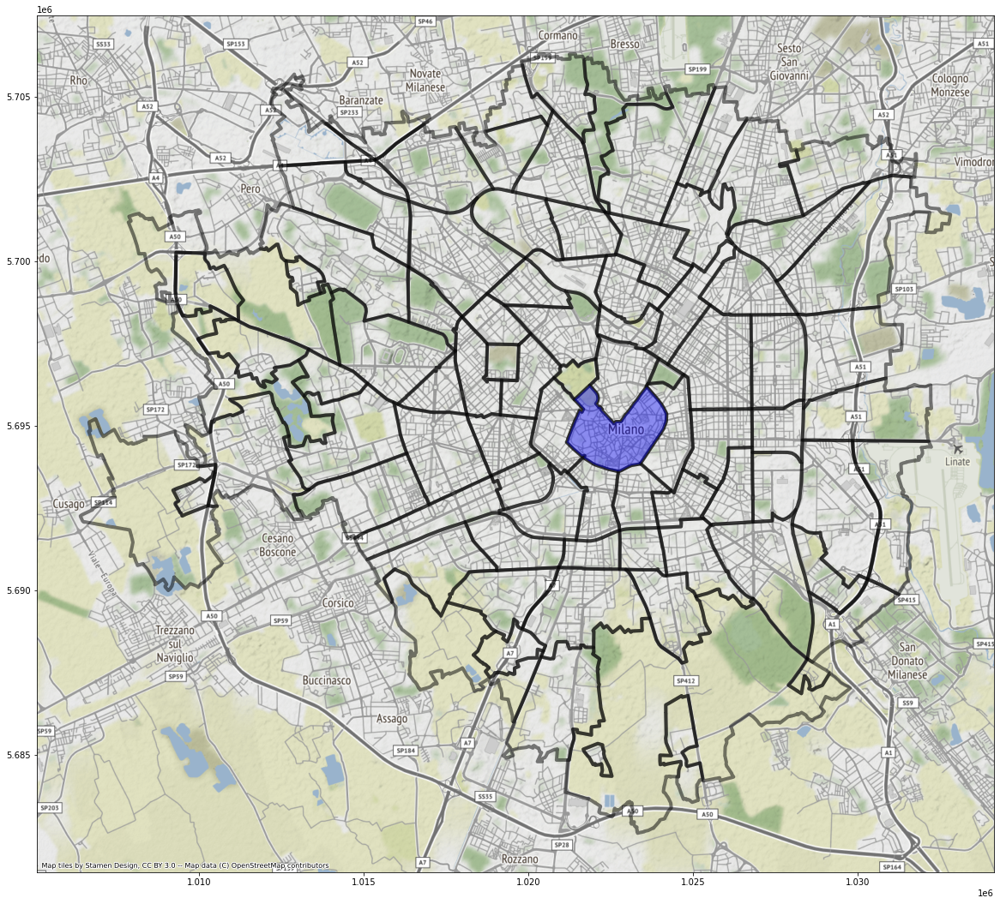

In [ ]:
print("- una mappa di Milano con l'indicazione del quartiere con più aree di sosta;")
aree_sosta_max=aree_sosta_max.drop(columns=["geometry"])
aree_sosta_max_geo=pd.merge(aree_sosta_max, milano, how="left", on=['NIL']).to_crs(epsg= 3857)
ax=milano.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "none",alpha = 0.5, edgecolor = "k", linewidth = 4)
aree_sosta_max_geo.to_crs(epsg=3857).plot(ax=ax, facecolor= "b",alpha = 0.4, linewidth= 3, edgecolor= "none")
contextily.add_basemap(ax)

In [ ]:
print("- i nomi dei quartieri con un numero di aree di sosta minori della media;")
aree_sosta_Meno_Mediax=Df_strade_sostaBici_milano.groupby("NIL").count().reset_index()
aree_sosta_Meno_Mediax=aree_sosta_Meno_Mediax[aree_sosta_Meno_Mediax["stalli_tot"]<aree_sosta_Meno_Mediax["stalli_tot"].mean()]
aree_sosta_Meno_Mediax[["NIL"]]

- una mappa di Milano con l'indicazione  dei quartieri con un numero di aree di sosta minori della media;


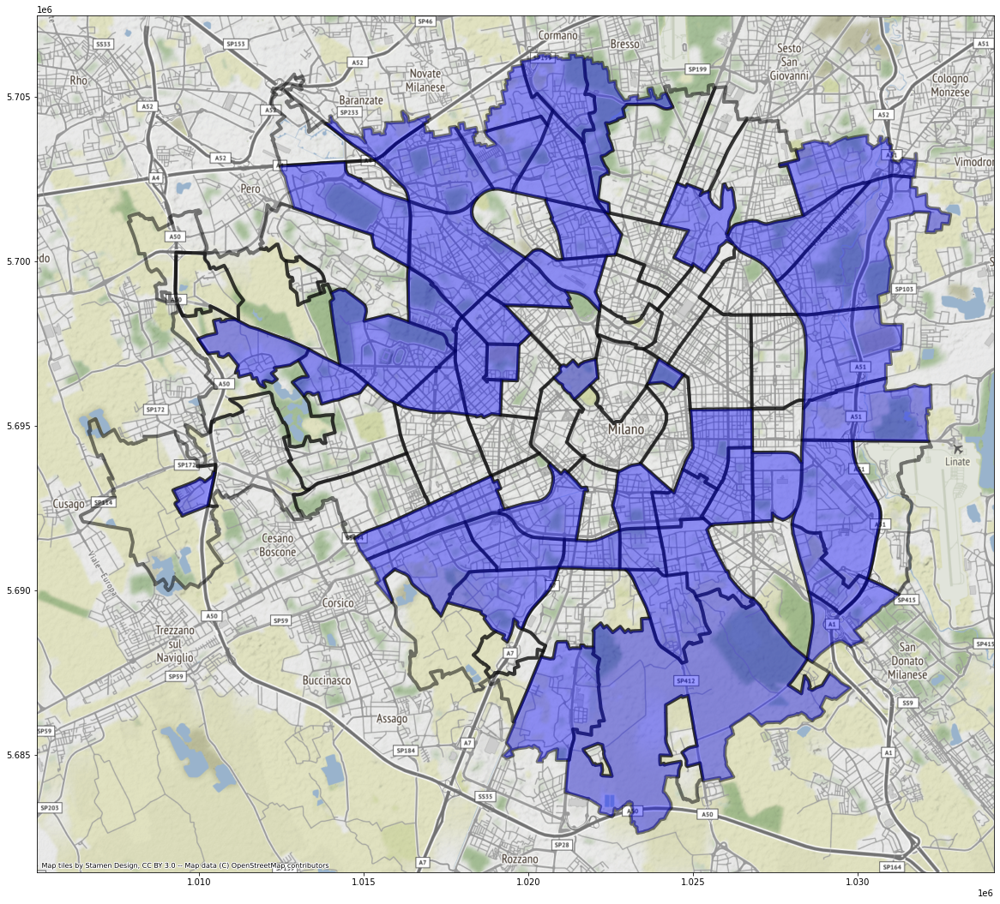

In [ ]:
print("- una mappa di Milano con l'indicazione  dei quartieri con un numero di aree di sosta minori della media;")
aree_sosta_Meno_Mediax=aree_sosta_Meno_Mediax.drop(columns=["geometry"])
aree_sosta_Meno_Mediax=pd.merge(aree_sosta_Meno_Mediax, milano, how="left", on=['NIL']).to_crs(epsg= 3857)
ax=milano.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "none",alpha = 0.5, edgecolor = "k", linewidth = 4)
aree_sosta_Meno_Mediax.to_crs(epsg=3857).plot(ax=ax, facecolor= "b",alpha = 0.4, linewidth= 3, edgecolor= "none")
contextily.add_basemap(ax)

- una mappa di Milano con i diversi quartieri contornati in nero e l'indicazione delle aree di sosta, sottoforma di punti rossi;


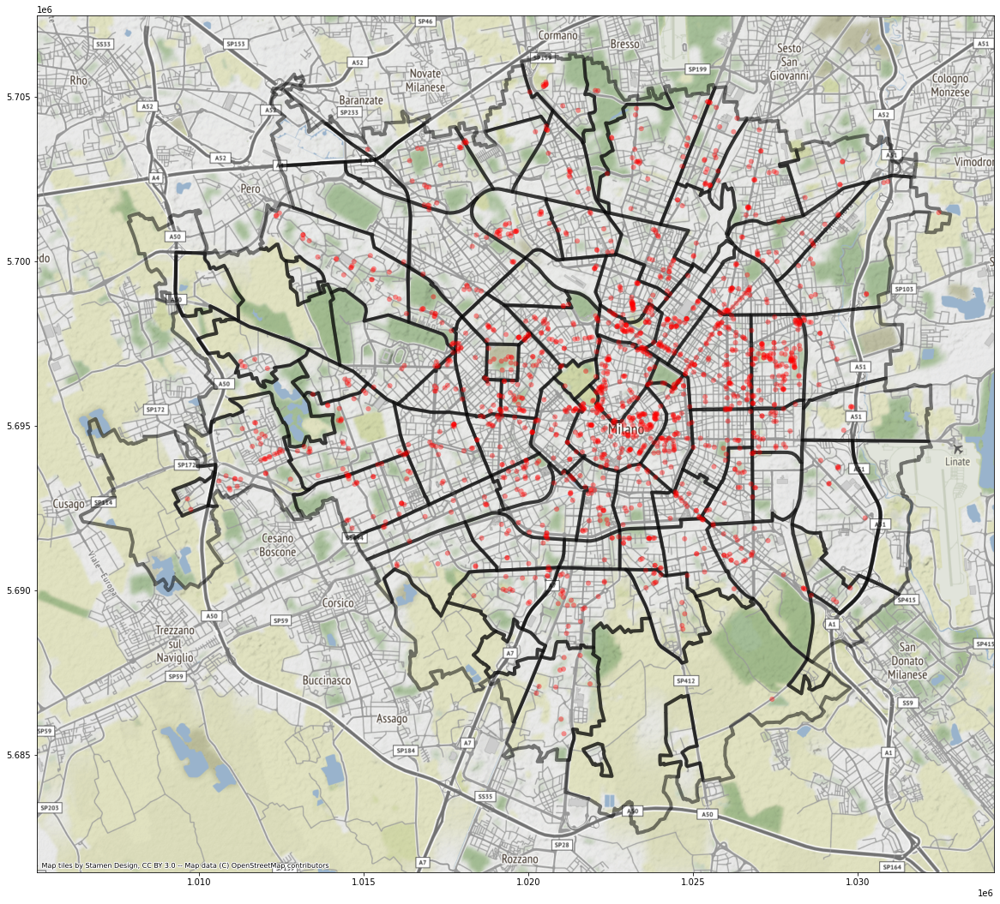

In [ ]:
print("- una mappa di Milano con i diversi quartieri contornati in nero e l'indicazione delle aree di sosta, sottoforma di punti rossi;")
ax=milano.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "none",alpha = 0.5, edgecolor = "k", linewidth = 4)
sostaBici.to_crs(epsg=3857).plot(ax=ax, facecolor= "r",alpha = 0.4, linewidth= 3, edgecolor= "none")
contextily.add_basemap(ax)

- una mappa di Milano con i diversi quartieri colorati a seconda del numero di aree di sosta presenti, con una legenda che indichi il significato dei colori;


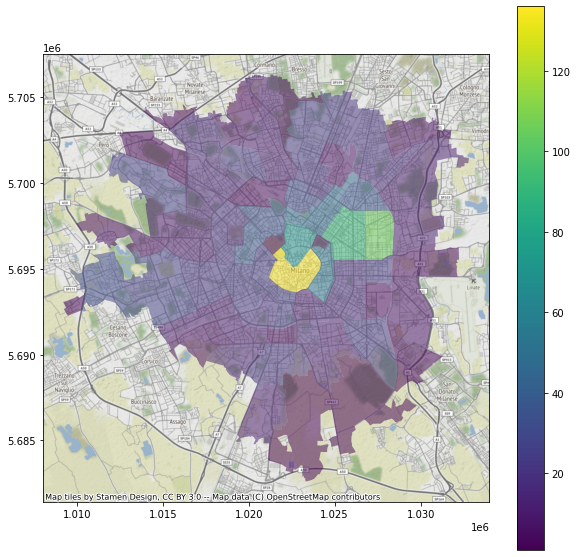

In [ ]:
print("- una mappa di Milano con i diversi quartieri colorati a seconda del numero di aree di sosta presenti, con una legenda che indichi il significato dei colori;")
Df_strade_sostaBici_milano_count=Df_strade_sostaBici_milano.groupby("NIL").count().reset_index()

Df_strade_sostaBici_milano_count=pd.merge(milano,Df_strade_sostaBici_milano_count, how="left", on=['NIL'])

Df_strade_sostaBici_milano_count.rename(columns = {'geometry_x':'geometry'}, inplace = True)

ax=Df_strade_sostaBici_milano_count.to_crs(epsg=3857).plot(figsize=(10,10),markersize=5, column="stalli_tot",legend=True,alpha=0.5)
contextily.add_basemap(ax)

In [ ]:
print("RICHIESTE: ")
print("- data una via (inserita dall'utente), avere le aree di sosta di quella via")


RICHIESTE: 
- data una via (inserita dall'utente), avere le aree di sosta di quella via


In [ ]:
a=input()
a

ABBIATEGRASSO


'ABBIATEGRASSO'

In [ ]:
via_cercata=Df_strade_sostaBici[Df_strade_sostaBici["DESCRIZIONE_VIA"]==a][["stalli_tot"]]
if via_cercata.empty:
  print("Inserire una via conosciuta")
else:
 via_cercata

- dato un quartiere (inserito dall'utente), avere la mappa di quel quartiere con l'indicazione della posizione delle aree di sosta
AFFORI


/usr/local/lib/python3.7/dist-packages/geopandas/base.py:31: UserWarning: The indices of the two GeoSeries are different.
  warn("The indices of the two GeoSeries are different.")


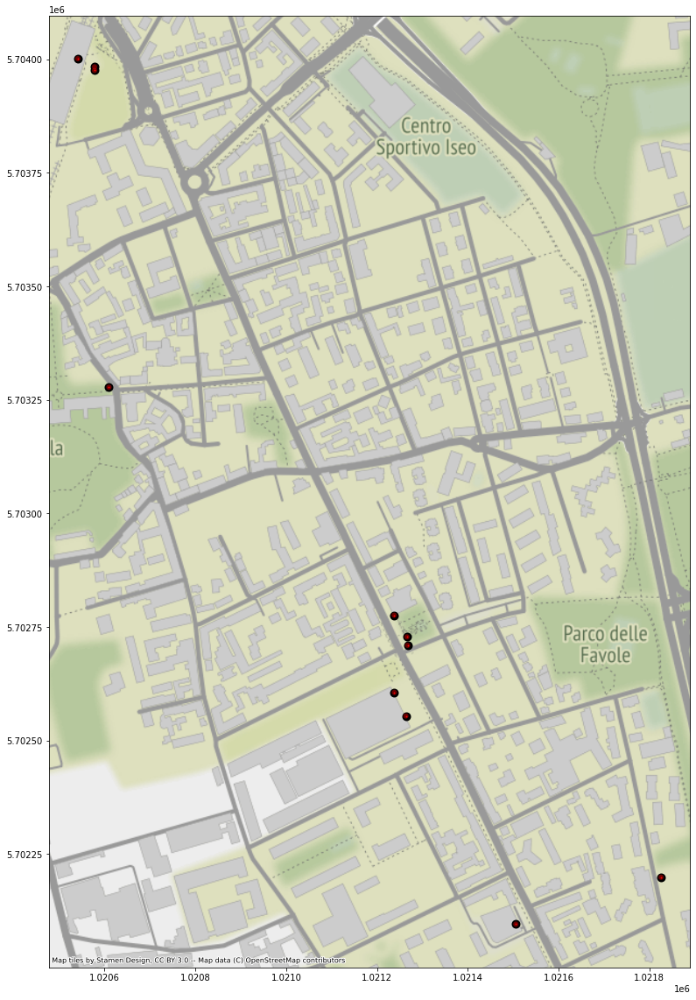

In [ ]:
print("- dato un quartiere (inserito dall'utente), avere la mappa di quel quartiere con l'indicazione della posizione delle aree di sosta")
quartiere=input()
quartiere_cercato= Df_strade_sostaBici_milano[Df_strade_sostaBici_milano["NIL"]==quartiere]
if quartiere_cercato.empty:
  print("Inserire un quartiere conosciuto")
else:
  ax=quartiere_cercato.to_crs(epsg = 3857).plot(figsize=(20,20), facecolor = "r",alpha = 1, edgecolor = "k", linewidth = 4)
  sostaBici[sostaBici.within(quartiere_cercato.geometry.squeeze())].to_crs(epsg=3857).plot(ax=ax, facecolor= "r",alpha = 0.4, linewidth= 3, edgecolor= "none")
  contextily.add_basemap(ax)

In [ ]:
sostaBici

,id_amat,id_via,num_civico,municipio,stato,categoriev,numero_man,stalli_per,stalli_tot,tipomanufa,ubicazione,geometry
0,2,5339.0,0,5,Esistente,Velocipedi,3,5,15,Verona,Marciapiede,POINT (1021713.272 5689457.937)
1,4,1545.0,21,9,Esistente,Velocipedi,2,5,10,0_Non precisato,Alla quota della carreggiata,POINT (1020609.678 5703278.104)
2,8,6330.0,42,7,Esistente,Velocipedi,1,5,5,Redondo Inox,Cortile o altro spazio collegato al civico,POINT (1011315.437 5696816.682)
3,9,7165.0,4,8,Esistente,Velocipedi,1,5,5,Redondo Inox,Cortile o altro spazio collegato al civico,POINT (1019322.014 5697768.905)
4,10,6660.0,5,6,Esistente,Velocipedi,1,4,4,0_Non precisato,Marciapiede,POINT (1015293.689 5693448.080)
...,...,...,...,...,...,...,...,...,...,...,...,...
1517,3232,1242.0,72,9,Esistente,Velocipedi,3,4,12,Triangolare,Cortile o altro spazio collegato al civico,POINT (1020338.369 5701424.157)
1518,3233,1242.0,72,9,Esistente,Velocipedi,5,2,10,Archetto Milano _ Acciaio inox _ Passo cm 80,Cortile o altro spazio collegato al civico,POINT (1020385.154 5701510.770)
1519,3234,1242.0,72,9,Esistente,Velocipedi,6,2,12,Archetto Milano _ Acciaio inox _ Passo cm 80,Cortile o altro spazio collegato al civico,POINT (1020392.365 5701485.261)
1520,3235,1242.0,72,9,Esistente,Velocipedi,29,2,58,Archetto Milano _ Acciaio inox _ Passo cm 80,Cortile o altro spazio collegato al civico,POINT (1020390.710 5701428.245)


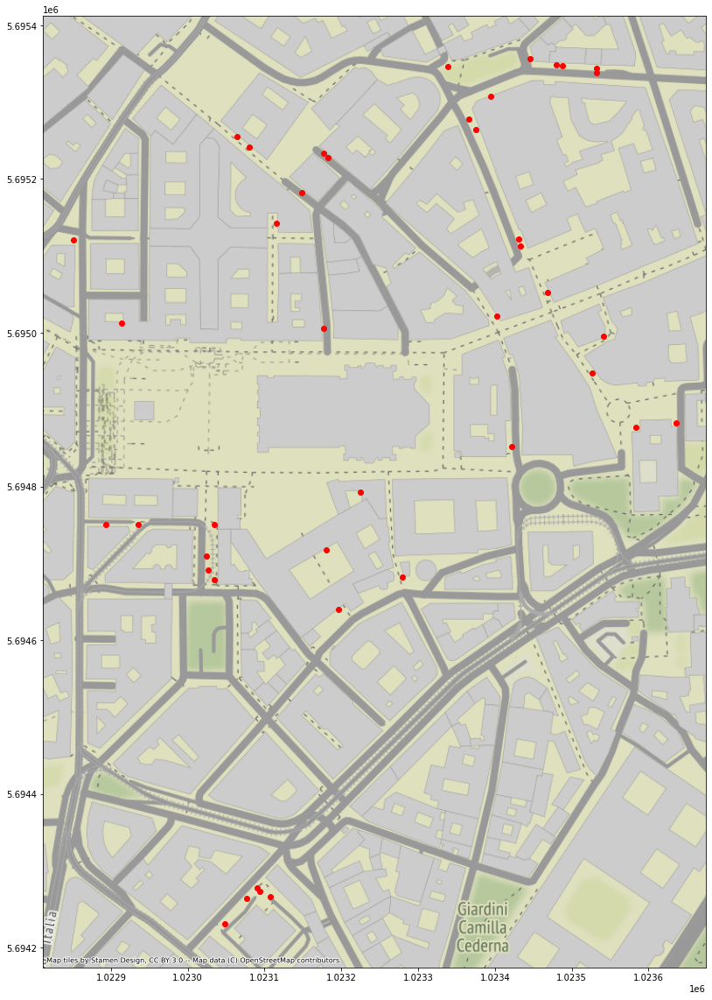

In [ ]:
longitudine = float(input("Inserisci la longitudine: "))
latitudine = float(input("Inserisci la latitudine: "))
#duomo: 9.191383, 45.464211 

punto = Point(longitudine,latitudine)

buffer_punto = punto.buffer(0.0044) # 500 gradi in metri sono 0.0044 metri
aree_sosta_meno500 = sostaBici[sostaBici.within(buffer_punto)]

ax = aree_sosta_meno500.to_crs(epsg=3857).plot(figsize=(20,20), color= "r")
contextily.add_basemap(ax)